In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from GRU import DatasetW
from GRU import RNN

In [ ]:
pendulum = np.load('s_sincos.npy')

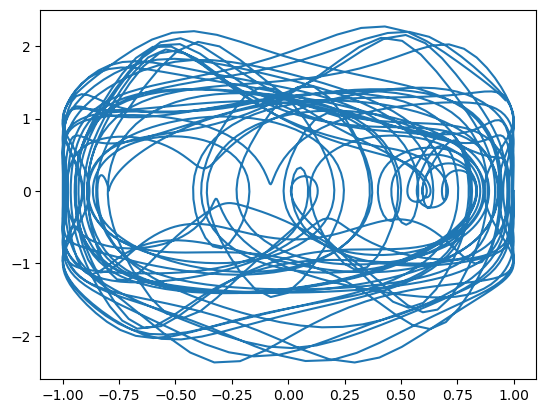

In [49]:
plt.plot(pendulum[:4000, 0], pendulum[:4000, 4])

In [4]:
seq_length = 50
device = torch.device("cuda" if torch.cuda.is_available() else "cpu" if torch.backends.mps.is_available() else "cpu")
print(device)

cpu


In [5]:
train_dataset = DatasetW(pendulum[10000:][::2], seq_length)

In [6]:
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, drop_last=True)

In [7]:
model = RNN(input_size = 6, hidden_size = 600, output_size = 6)
model.load_state_dict(torch.load('model_pendulum.pth'))

/var/folders/j1/w77jn90n4xz0jc6gqk110_x00000gn/T/ipykernel_41750/155800021.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('model_pendul

<All keys matched successfully>

In [8]:
criterion = nn.MSELoss()  
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-5, betas=(0.9, 0.999))
num_epochs = 15
model.to(device)

RNN(
  (rnn_cell): GRU_Cell(
    (linear): Sequential(
      (0): Linear(in_features=600, out_features=600, bias=True)
      (1): ReLU()
      (2): Linear(in_features=600, out_features=6, bias=True)
    )
    (layer_norm): LayerNorm((600,), eps=1e-05, elementwise_affine=True)
  )
)

In [9]:
from GRU import train_model

In [10]:
train_model(model, train_loader, criterion, optimizer, num_epochs, device, normalize_sincos_values = True)

Epoch 0 of 15
Epoch 1 of 15
Epoch 2 of 15
Epoch 3 of 15
Epoch 4 of 15
Epoch 5 of 15
Epoch 6 of 15
Epoch 7 of 15
Epoch 8 of 15
Epoch 9 of 15
Epoch 10 of 15
Epoch 11 of 15
Epoch 12 of 15
Epoch 13 of 15
Epoch 14 of 15


In [22]:
torch.save(model.state_dict(), 'model_pendulum.pth')

In [10]:
def predict_futuree(model, seed_data, future_steps, mean, std):
        model.eval()
        d = seed_data.shape[1]
        if isinstance(seed_data, np.ndarray):
            seed_data = torch.tensor(seed_data, dtype=torch.float32).to(device)
        print(seed_data.shape)
        x = seed_data.view(1, -1, d)
        print(x.shape)
        with torch.no_grad():
            output, hidden = model(x[:, 0, :].unsqueeze(1))
            last_state = x[:, 0, :]
            for i in range(150):
                delta, hidden = model.rnn_cell(x[:, i, :], hidden)
                last_state = x[:, i, :]
                
            predictions = [last_state.unsqueeze(1)]
            
            for _ in range(future_steps - 1):
                out, hidden = model.rnn_cell(last_state, hidden)
                sin1, cos1 = out[:, 0], out[:, 1]
                norm1 = torch.sqrt(sin1**2 + cos1**2)
                out[:, 0] = sin1 / (norm1 + 1e-10)
                out[:, 1] = cos1 / (norm1 + 1e-10)
                
                sin2, cos2 = out[:, 2], out[:, 3]
                norm2 = torch.sqrt(sin2**2 + cos2**2)
                out[:, 2] = sin2 / (norm2 + 1e-10)
                out[:, 3] = cos2 / (norm2 + 1e-10)
                last_state = out
                predictions.append(last_state.unsqueeze(1))
                
            predictions = torch.cat(predictions, dim=1)
        
        pred_norm = predictions.squeeze().cpu().numpy()
        return pred_norm


pred_norm = predict_futuree(model, pendulum[10000:][::2], 5000, 0, 0)

torch.Size([35000, 6])
torch.Size([1, 35000, 6])


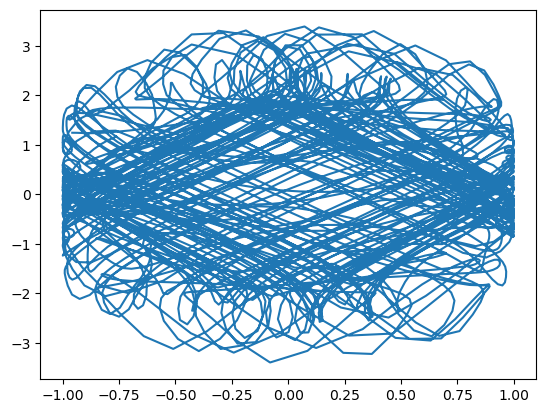

In [56]:
plt.plot(pred_norm[:, 0], pred_norm[:, 5])

In [21]:
pendulum.shape

(80000, 6)

In [44]:
lyap = model.lyapunov_exponents(pendulum[10000:][::2], 2500, 0.1, 500, 1, 1, 0, True)

In [57]:
def sincos_to_angles(predictions_sincos):
    sin_theta1 = predictions_sincos[:, 0]
    cos_theta1 = predictions_sincos[:, 1]
    sin_theta2 = predictions_sincos[:, 2]
    cos_theta2 = predictions_sincos[:, 3]
    omega1 = predictions_sincos[:, 4]
    omega2 = predictions_sincos[:, 5]
    theta1 = np.arctan2(sin_theta1, cos_theta1)
    theta2 = np.arctan2(sin_theta2, cos_theta2)
    
    return np.column_stack([theta1, theta2, omega1, omega2])

In [58]:
from matplotlib.animation import FuncAnimation

predictions_angles = sincos_to_angles(pred_norm)

skip = 1
dt = 0.1
s_anim = predictions_angles[:1000:skip, :]
t_anim = np.arange(0, len(s_anim)*dt, dt) 


In [59]:
theta1 = s_anim[:, 0]
theta2 = s_anim[:, 1]
x1 = np.sin(theta1)
y1 = -np.cos(theta1)
x2 = x1 + np.sin(theta2)
y2 = y1 - np.cos(theta2)

In [60]:
g = 9.81
dtheta1 = s_anim[:, 2]
dtheta2 = s_anim[:, 3]
v1_x = np.cos(theta1) * dtheta1
v1_y = np.sin(theta1) * dtheta1
v2_x = v1_x + np.cos(theta2) * dtheta2
v2_y = v1_y + np.sin(theta2) * dtheta2
E_anim = g * (0.5*(v1_x**2 + v1_y**2 + v2_x**2 + v2_y**2) + (y1 + y2))

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


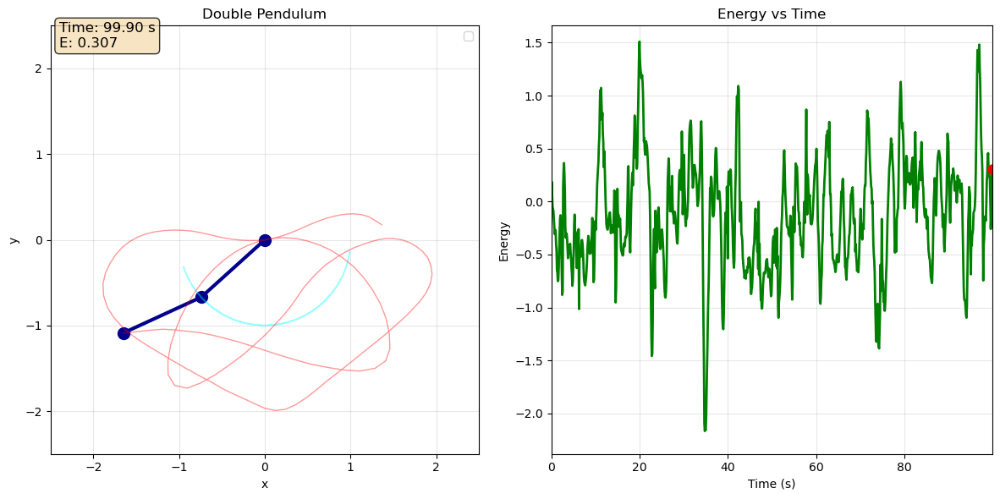

In [61]:
fig = plt.figure(figsize=(12, 6))
ax1 = plt.subplot(121)
ax2 = plt.subplot(122)

ax1.set_xlim(-2.5, 2.5)
ax1.set_ylim(-2.5, 2.5)
ax1.set_aspect('equal')
ax1.grid(True, alpha=0.3)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_title('Double Pendulum')

ax2.set_xlim(0, t_anim[-1])
ax2.set_ylim(E_anim.min()*1.1, E_anim.max()*1.1)
ax2.grid(True, alpha=0.3)
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Energy')
ax2.set_title('Energy vs Time')

line, = ax1.plot([], [], 'o-', lw=3, markersize=10, color='darkblue')
trace1, = ax1.plot([], [], '-', lw=1, alpha=0.4, color='cyan')
trace2, = ax1.plot([], [], '-', lw=1, alpha=0.4, color='red')
energy_line, = ax2.plot([], [], 'g-', lw=2)
energy_point, = ax2.plot([], [], 'ro', markersize=8)
time_text = ax1.text(0.02, 0.95, '', transform=ax1.transAxes, fontsize=12,
                     bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

ax1.legend(loc='upper right')

trace_length = 150
x1_hist, y1_hist = [], []
x2_hist, y2_hist = [], []
t_hist, e_hist = [], []

def init():
    line.set_data([], [])
    trace1.set_data([], [])
    trace2.set_data([], [])
    energy_line.set_data([], [])
    energy_point.set_data([], [])
    time_text.set_text('')
    return line, trace1, trace2, energy_line, energy_point, time_text

def animate(i):
    x_points = [0, x1[i], x2[i]]
    y_points = [0, y1[i], y2[i]]
    line.set_data(x_points, y_points)
    
    x1_hist.append(x1[i])
    y1_hist.append(y1[i])
    x2_hist.append(x2[i])
    y2_hist.append(y2[i])
    
    if len(x1_hist) > trace_length:
        x1_hist.pop(0)
        y1_hist.pop(0)
        x2_hist.pop(0)
        y2_hist.pop(0)
    
    trace1.set_data(x1_hist, y1_hist)
    trace2.set_data(x2_hist, y2_hist)
    
    t_hist.append(t_anim[i])
    e_hist.append(E_anim[i])
    energy_line.set_data(t_hist, e_hist)
    energy_point.set_data([t_anim[i]], [E_anim[i]])
    
    time_text.set_text(f'Time: {t_anim[i]:.2f} s\nE: {E_anim[i]:.3f}')
    
    return line, trace1, trace2, energy_line, energy_point, time_text

anim = FuncAnimation(fig, animate, init_func=init,
                    frames=len(t_anim), interval=20, blit=True)

plt.tight_layout()
anim.save('double_pendulum_GRU.gif', writer='pillow')
plt.show()

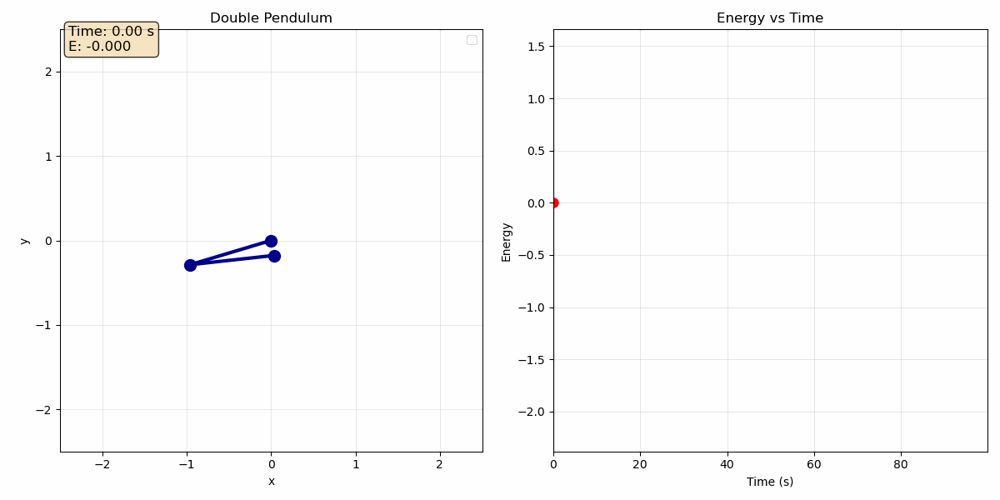

In [62]:
from IPython.display import Image, display

display(Image(filename='double_pendulum_GRU.gif'))
